## $Inteligencia$ $artificial$
#$Red$ $GAN$
#$Nicolas$ $Garzon$ $Carvajal$
#$Juan$ $Felipe$ $Balaguera$
#$Alex$ $Duran$


In [1]:
# ----------------------------------------
# 1. Instalar dependencias necesarias
# ----------------------------------------
!pip install -q kagglehub
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as dset
import torchvision.utils as vutils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import kagglehub
import shutil

In [2]:
# ----------------------------------------
# 2. Descargar dataset con kagglehub
# ----------------------------------------
path = kagglehub.dataset_download("crawford/cat-dataset")
print("✅ Dataset descargado en:", path)

✅ Dataset descargado en: /kaggle/input/cat-dataset


In [3]:
# ----------------------------------------
# 3. Reorganizar imágenes para ImageFolder
# ----------------------------------------
source_base = os.path.join(path, "cats")
target_base = "data/cats_dataset/cat"
os.makedirs(target_base, exist_ok=True)

for folder in os.listdir(source_base):
    subfolder_path = os.path.join(source_base, folder)
    if os.path.isdir(subfolder_path) and folder.startswith("CAT_"):
        for file in os.listdir(subfolder_path):
            if file.lower().endswith(".jpg"):
                source_file = os.path.join(subfolder_path, file)
                target_file = os.path.join(target_base, f"{folder}_{file}")
                shutil.copy2(source_file, target_file)

print("✅ Reorganización completada.")

✅ Reorganización completada.


In [4]:
# ----------------------------------------
# 4. Preparar dataloader
# ----------------------------------------
image_size = 64
batch_size = 128

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset = dset.ImageFolder(root="data/cats_dataset", transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
print(f"✅ Total de imágenes cargadas: {len(dataset)}")

✅ Total de imágenes cargadas: 9997


In [5]:
# ----------------------------------------
# 5. Definir DCGAN
# ----------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Usando dispositivo: {device}")

nz = 100     # Tamaño del vector de ruido
ngf = 64     # Filtros generador
ndf = 64     # Filtros discriminador
nc = 3       # Canales (RGB)

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf), nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.main(input)

netG = Generator().to(device)
netD = Discriminator().to(device)

# Inicialización
def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
netG.apply(weights_init)
netD.apply(weights_init)

✅ Usando dispositivo: cuda


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [6]:
# ----------------------------------------
# 6. Entrenamiento DCGAN
# ----------------------------------------
criterion = nn.BCELoss()
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

real_label = 1.
fake_label = 0.
num_epochs = 100  # Puedes aumentar si tienes tiempo/GPU

os.makedirs("output", exist_ok=True)

for epoch in range(num_epochs):
    for i, (data, _) in enumerate(dataloader):
        ## Entrenamiento Discriminador
        netD.zero_grad()
        real = data.to(device)
        b_size = real.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ## Entrenamiento Generador
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print(f"[{epoch}/{num_epochs}] [{i}/{len(dataloader)}] Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    vutils.save_image(fake, f"output/fake_epoch_{epoch:03d}.png", normalize=True)

print("✅ Entrenamiento completado.")

[0/100] [0/79] Loss_D: 1.3886 Loss_G: 0.7156 D(x): 0.5020 D(G(z)): 0.5031 / 0.4889
[0/100] [50/79] Loss_D: 0.1045 Loss_G: 3.0016 D(x): 0.9517 D(G(z)): 0.0535 / 0.0497
[1/100] [0/79] Loss_D: 0.0466 Loss_G: 3.7860 D(x): 0.9794 D(G(z)): 0.0254 / 0.0227
[1/100] [50/79] Loss_D: 0.0185 Loss_G: 4.7430 D(x): 0.9921 D(G(z)): 0.0105 / 0.0088
[2/100] [0/79] Loss_D: 0.0123 Loss_G: 5.1718 D(x): 0.9945 D(G(z)): 0.0067 / 0.0058
[2/100] [50/79] Loss_D: 0.0775 Loss_G: 4.9044 D(x): 0.9606 D(G(z)): 0.0363 / 0.0076
[3/100] [0/79] Loss_D: 0.0400 Loss_G: 5.3626 D(x): 0.9777 D(G(z)): 0.0172 / 0.0048
[3/100] [50/79] Loss_D: 0.9152 Loss_G: 3.2911 D(x): 0.6033 D(G(z)): 0.2770 / 0.0390
[4/100] [0/79] Loss_D: 0.1486 Loss_G: 4.1746 D(x): 0.8985 D(G(z)): 0.0338 / 0.0165
[4/100] [50/79] Loss_D: 1.0364 Loss_G: 2.3330 D(x): 0.8068 D(G(z)): 0.5211 / 0.1062
[5/100] [0/79] Loss_D: 0.1192 Loss_G: 3.7124 D(x): 0.9179 D(G(z)): 0.0277 / 0.0290
[5/100] [50/79] Loss_D: 0.4250 Loss_G: 2.9034 D(x): 0.7513 D(G(z)): 0.1013 / 0.060

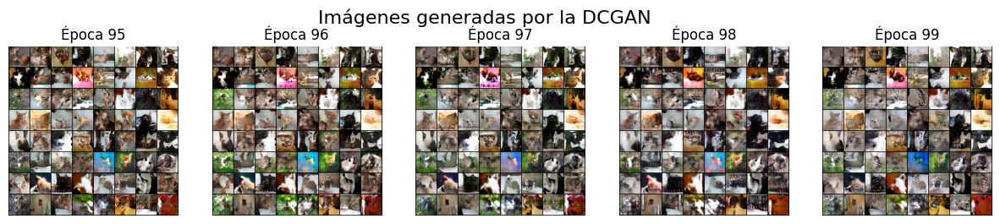

In [7]:
# ----------------------------------------
# Mostrar imágenes generadas después del entrenamiento
# ----------------------------------------
import glob
from PIL import Image

# Obtener la lista de imágenes generadas
generated_imgs = sorted(glob.glob("output/fake_epoch_*.png"))

# Mostrar las últimas N imágenes (por ejemplo, las 5 más recientes)
N = 5
plt.figure(figsize=(15, 3))

for idx, img_path in enumerate(generated_imgs[-N:]):
    img = Image.open(img_path)
    plt.subplot(1, N, idx + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Época {idx + len(generated_imgs) - N}")

plt.suptitle("Imágenes generadas por la DCGAN", fontsize=16)
plt.show()

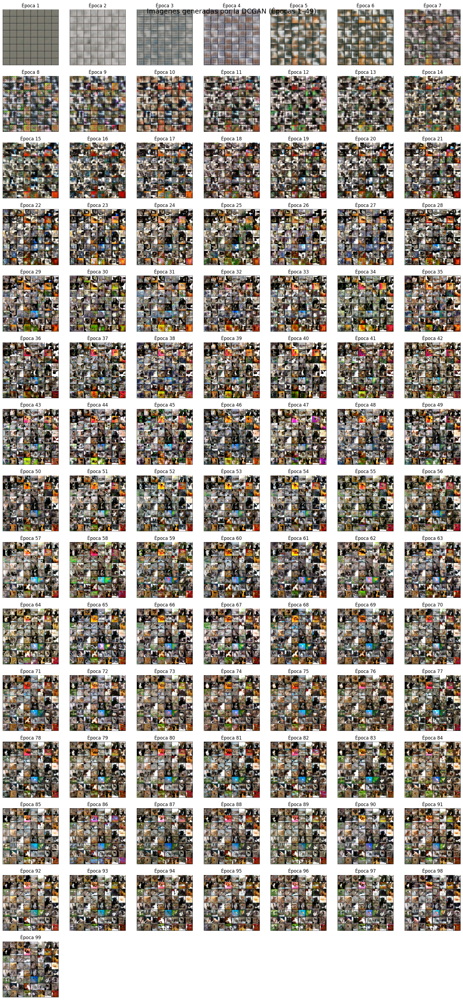

In [9]:
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Obtener la lista de imágenes generadas (ordenadas)
generated_imgs = sorted(glob.glob("output/fake_epoch_*.png"))

# Filtrar desde época 1 hasta 49
# Extrae el número de época de cada nombre de archivo y filtra
filtered_imgs = [img for img in generated_imgs if 1 <= int(img.split("_")[-1].split(".")[0]) <= 99]

# Parámetros de visualización
num_imgs = len(filtered_imgs)
cols = 7
rows = (num_imgs + cols - 1) // cols

plt.figure(figsize=(cols * 2.5, rows * 2.5))

for idx, img_path in enumerate(filtered_imgs):
    img = Image.open(img_path)
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Época {int(img_path.split('_')[-1].split('.')[0])}")

plt.suptitle("Imágenes generadas por la DCGAN (Épocas 1–49)", fontsize=18)
plt.tight_layout()
plt.show()